STUDENT NAME : SHIVAANI KATRAGADDA

STUDENT NUMBER : R00183214

SUBJECT : APPLIED MACHINE LEARNING

ASSIGNMENT NUMBER : 2

PROFESSOR : DR. HAITHEM AFLI

DATE : 17 MAY 2020

DAY : SUNDAY

In [1]:
#intalling plotly
#I have already installed in my pc so I am marking the commands as comment professor.
#pip install plotly


In [2]:
#installing pandas_profiling
#I have already installed in my pc so I am marking the commands as comment professor.
#pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [3]:
#IMPORTING ALL PACKAGES

import os
import tarfile
import urllib
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas_profiling as pp
from zlib import crc32
from sklearn.model_selection import StratifiedShuffleSplit
import matplotlib.image as mpimg
import plotly.graph_objects as go
from pandas.plotting import scatter_matrix
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from scipy import stats

In [4]:
#I] GETTING THE DATA
# DOWNLOADING DATA FROM THE REPOSITORY
DOWNLOAD_ROOT = "http://raw.githubusercontent.com/ageron/handson-ml2/master/"
HOUSING_PATH = os.path.join("datasets","housing")
HOUSING_URL = DOWNLOAD_ROOT + "datasets/housing/housing.tgz"

In [5]:
#FUNCTION TO GET DATA FROM REPOSITORY

def fetch_data(housing_url=HOUSING_URL, housing_path=HOUSING_PATH):
    os.makedirs(housing_path, exist_ok=True)
    tgz_path = os.path.join(housing_path, "housing.tgz")
    urllib.request.urlretrieve(housing_url, tgz_path)
    housing_tgz = tarfile.open(tgz_path)
    housing_tgz.extractall(path=housing_path)
    housing_tgz.close()

In [6]:
#FUNCTION TO IMPORT DATASET TO NOTEBOOK/EDITOR

def load_data(housing_path=HOUSING_PATH):
    csv_path = os.path.join(housing_path, "housing.csv")
    return pd.read_csv(csv_path)

In [7]:
#fetching the dataset
fetch_data(housing_url=HOUSING_URL, housing_path=HOUSING_PATH)

In [8]:
#loading the data
load_data(housing_path=HOUSING_PATH)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [9]:
#loading the data into a variable called housing
housing = load_data()
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [10]:
#creating profiling Report which gives brief description about the dataset and produce HTML profiling report

housing.profile_report()

In [11]:
#seeing the basic info 
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
longitude             20640 non-null float64
latitude              20640 non-null float64
housing_median_age    20640 non-null float64
total_rooms           20640 non-null float64
total_bedrooms        20433 non-null float64
population            20640 non-null float64
households            20640 non-null float64
median_income         20640 non-null float64
median_house_value    20640 non-null float64
ocean_proximity       20640 non-null object
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [12]:
#shape of the dataset
housing.shape

(20640, 10)

In [13]:
#columns in the dataset
housing.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [14]:
#describes about the dataset
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [15]:
#checks whether is there any missing values
housing.isnull().any()

longitude             False
latitude              False
housing_median_age    False
total_rooms           False
total_bedrooms         True
population            False
households            False
median_income         False
median_house_value    False
ocean_proximity       False
dtype: bool

In [16]:
#gives the sum of missing values 
housing.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

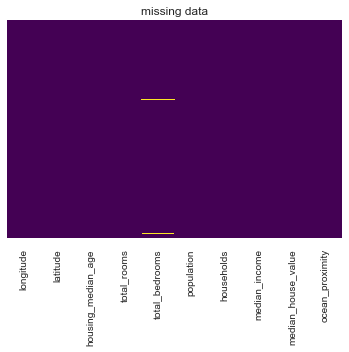

In [17]:
#heatmap for missing values
sns.heatmap(housing.isnull(),cmap='viridis',cbar=False,yticklabels=False)
plt.title('missing data')
plt.show()

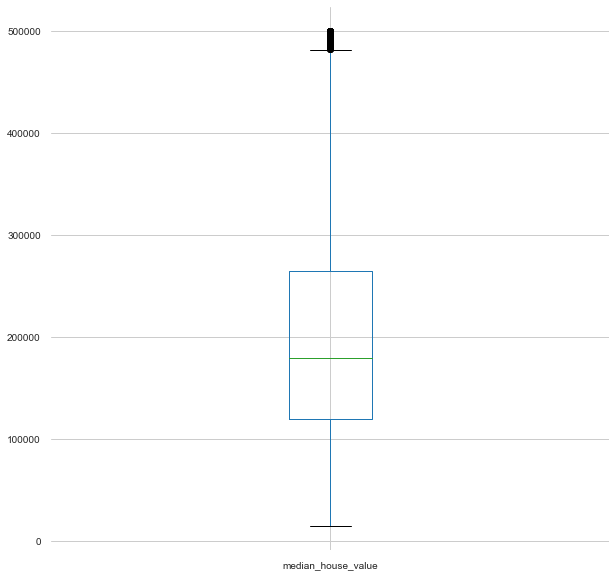

In [18]:
# boxplot 
housing.boxplot(['median_house_value'], figsize=(10, 10))

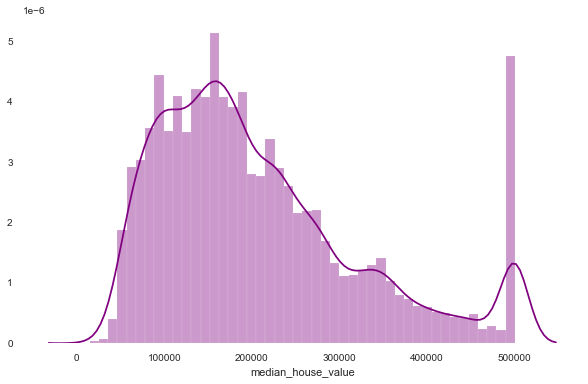

In [19]:
#plot for median_house_value
plt.figure(figsize=(10,6))
sns.distplot(housing['median_house_value'],color='purple')
plt.show()

[]

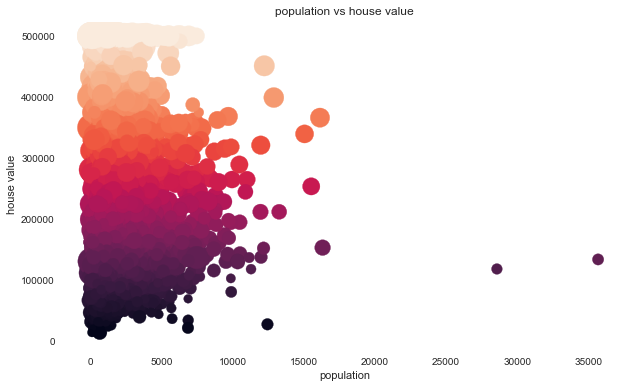

In [20]:
#sctterplot
plt.figure(figsize=(10,6))

plt.scatter(housing['population'],housing['median_house_value'],c=housing['median_house_value'],s=housing['median_income']*50)
plt.colorbar
plt.title('population vs house value' )
plt.xlabel('population')
plt.ylabel('house value')
plt.plot()

In [21]:
#getting to know which categories exists and how many districts belong to each category
housing['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

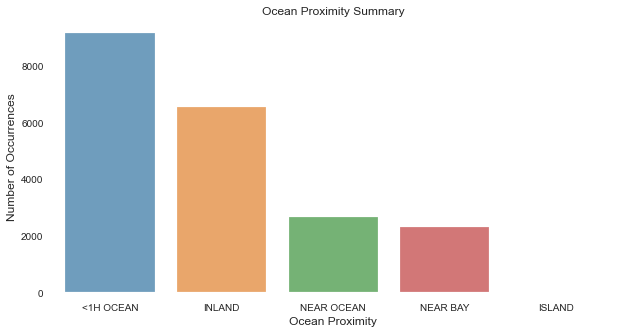

In [22]:
#barplot for the ocean_promixity
op_count = housing['ocean_proximity'].value_counts()
plt.figure(figsize=(10,5))
sns.barplot(op_count.index, op_count.values, alpha=0.7)
plt.title('Ocean Proximity Summary')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Ocean Proximity', fontsize=12)
plt.show()


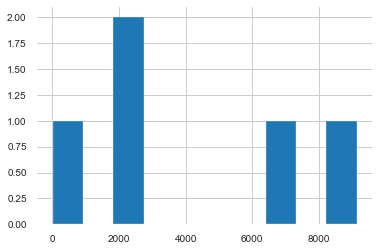

In [23]:
#histogram for value count of ocean proximity
housing['ocean_proximity'].value_counts().hist()

[]

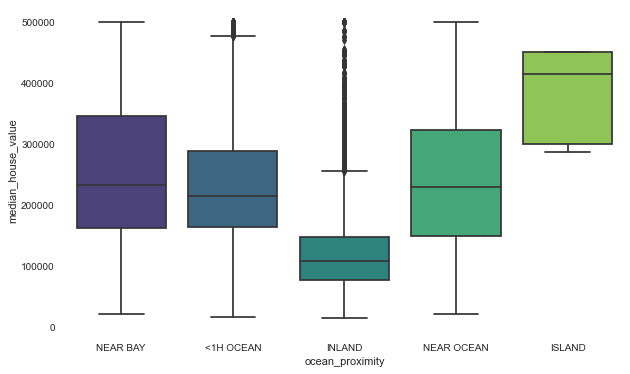

In [24]:
#boxplot of house value on ocean_proximity categories
plt.figure(figsize=(10,6))
sns.boxplot(data=housing,x='ocean_proximity',y='median_house_value',palette='viridis')
plt.plot()

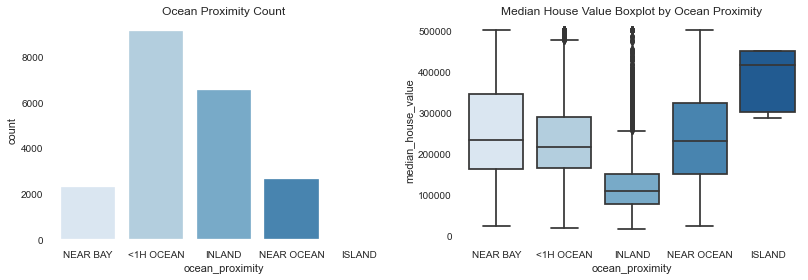

In [25]:
# ocean_proximity analysis 

fig=plt.figure(figsize=(17, 4))

plt.subplot(131)
g = sns.countplot(data=housing,x="ocean_proximity",palette="Blues",orient="v",dodge=True).set_title('Ocean Proximity Count')

plt.subplot(132)
sns.boxplot( x=housing["ocean_proximity"], y=housing["median_house_value"], palette="Blues").set_title('Median House Value Boxplot by Ocean Proximity')

plt.tight_layout()
plt.show()

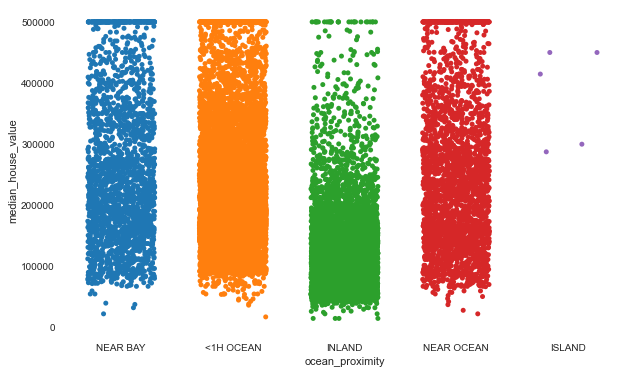

In [26]:
#stripplot for ocean_proximity and median_house_value
plt.figure(figsize=(10,6))

sns.stripplot(data=housing,x='ocean_proximity',y='median_house_value',jitter=0.3)

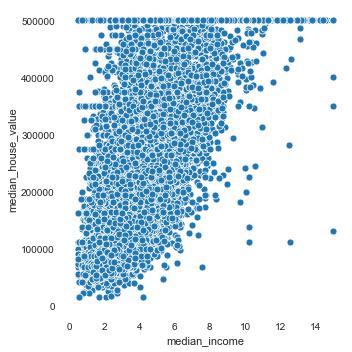

In [27]:
#plot for median_income median_house_value
sns.relplot(data=housing,x='median_income',y='median_house_value')

In [28]:
#scatter matrix
import plotly.express as px
fig = px.scatter_matrix(housing,
    dimensions=["median_house_value", "median_income", "total_rooms", "housing_median_age"])
fig.show()

In [29]:
#scatter plot 
fig = px.scatter(housing, x="median_income",
                 y="median_house_value", 
                 size='total_rooms')
fig.show()

In [30]:
#correlation matrix
(housing[['longitude','latitude','housing_median_age','total_rooms','total_bedrooms','population','households','median_income','median_house_value']]
 .corr().style.background_gradient( axis=None))
    
#The correlation matrix is a good way to visualize how the variables behave along with each other.
#It's also very useful for linear regression problems, once it helps us to select regressors high correlated with the response variables.
#As well as it will help us to avoid multicollinearity between the regressors.  
    
    
    

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1,-0.924664,-0.108197,0.044568,0.069608,0.0997732,0.0553101,-0.0151759,-0.0459666
latitude,-0.924664,1,0.0111727,-0.0360996,-0.0669828,-0.108785,-0.0710354,-0.0798091,-0.14416
housing_median_age,-0.108197,0.0111727,1,-0.361262,-0.320451,-0.296244,-0.302916,-0.119034,0.105623
total_rooms,0.044568,-0.0360996,-0.361262,1,0.93038,0.857126,0.918484,0.19805,0.134153
total_bedrooms,0.069608,-0.0669828,-0.320451,0.93038,1,0.877747,0.979728,-0.00772285,0.0496862
population,0.0997732,-0.108785,-0.296244,0.857126,0.877747,1,0.907222,0.00483435,-0.0246497
households,0.0553101,-0.0710354,-0.302916,0.918484,0.979728,0.907222,1,0.0130331,0.0658427
median_income,-0.0151759,-0.0798091,-0.119034,0.19805,-0.00772285,0.00483435,0.0130331,1,0.688075
median_house_value,-0.0459666,-0.14416,0.105623,0.134153,0.0496862,-0.0246497,0.0658427,0.688075,1


C:\Users\DELL\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

C:\Users\DELL\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.

C:\Users\DELL\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

C:\Users\DELL\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor relea

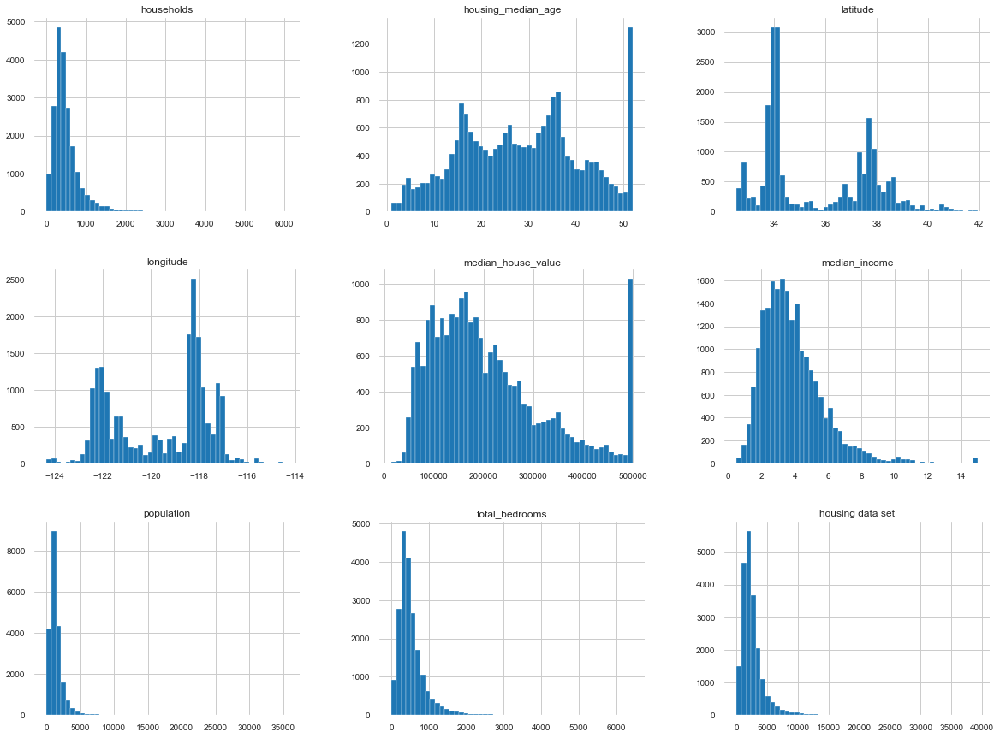

In [31]:
# histogram of housing dataset

housing.hist(bins=50, figsize=(20,15))
plt.title("housing data set")
plt.show()

In [32]:
#view of total_bedrooms column
housing['total_bedrooms']

0         129.0
1        1106.0
2         190.0
3         235.0
4         280.0
          ...  
20635     374.0
20636     150.0
20637     485.0
20638     409.0
20639     616.0
Name: total_bedrooms, Length: 20640, dtype: float64

In [33]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [34]:
len(housing)/100

206.4

In [35]:
206.4*20

4128.0

In [36]:
#II] CREATING A TEST SET
#FUNCTION TO SPLIT DATASET TO TRAIN AND TEST
import numpy as np
def split_train_test(data, test_ratio ):
    shuffled_indeces=np.random.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_indeces = shuffled_indeces[:test_set_size]
    train_indeces = shuffled_indeces[test_set_size:]
    return data.iloc[train_indeces], data.iloc[test_indeces]


In [37]:
#splitting the data
train_set, test_set = split_train_test(housing, 0.2)

In [38]:
#length of train set
len(train_set)

16512

In [39]:
#length of test set
len(test_set)

4128

In [40]:
#HASHING DATAS UNIQUE IDENTIFER
from zlib import crc32
def test_set_check(identifer, test_ratio):
    return crc32(np.int64(identifer))& 0xffffffff < test_ratio *2**32

In [41]:
#FUNCTION TO SPLIT DATASET BY ID
def split_train_test_by_id(data, test_ratio, id_coloumn):
    ids = data[id_coloumn]
    in_test_set = ids.apply(lambda id_: test_set_check(id_,test_ratio))
    return data.loc[~in_test_set], data.loc[in_test_set]

In [42]:
#ADDING INDEX COLOUMN TO THE ORIGINAL DATASET
housing_with_id = housing.reset_index()


In [43]:
housing_with_id

,index,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...,...
20635,20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [44]:
#train and test set with index column
train_set, test_set = split_train_test_by_id(housing_with_id,0.2,'index')

In [45]:
#length of train set
len(train_set)

16512

In [46]:
#length of test set
len(test_set)

4128

In [47]:
#CREATING UNIQUE IDENTIFER ID FROM THE DATASET
housing_with_id['id'] = housing['longitude']*1000 + housing['latitude']
train_set, test_set = split_train_test_by_id(housing_with_id,0.2,'id')

In [48]:
train_set

,index,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,id
0,0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,-122192.12
1,1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,-122182.14
2,2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,-122202.15
3,3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,-122212.15
4,4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,-122212.15
...,...,...,...,...,...,...,...,...,...,...,...,...
20635,20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,-121050.52
20636,20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,-121170.51
20637,20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,-121180.57
20638,20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,-121280.57


In [49]:
len(train_set)

16322

In [50]:
len(test_set)

4318

In [51]:
#PROCESS FOR STRATIFIED SAMPLING BY ADDING INCOME CAT ATTRIBUTE
housing['income_cat'] = pd.cut(housing['median_income'], bins = [0.,1.5,3.,4.5,6., np.inf],labels = [1,2,3,4,5])

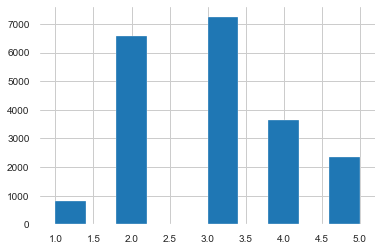

In [52]:

#histogram of income_cat
housing['income_cat'].hist()

In [53]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,5
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,5
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,5
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,4
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,3
...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,2
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,2
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,2
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,2


In [54]:
#CREATING STRATIFIED SPLIT BASED ON INCOME_CAT
from sklearn.model_selection import StratifiedShuffleSplit
split = StratifiedShuffleSplit(n_splits=1, test_size= 0.2, random_state=42)
for train_index, test_index in split.split(housing, housing['income_cat']):
    strat_train_set = housing.loc[train_index]
    strat_test_set = housing.loc[test_index]

In [55]:
print(strat_train_set)
print(len(strat_train_set))

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
17606    -121.89     37.29                38.0       1568.0           351.0   
18632    -121.93     37.05                14.0        679.0           108.0   
14650    -117.20     32.77                31.0       1952.0           471.0   
3230     -119.61     36.31                25.0       1847.0           371.0   
3555     -118.59     34.23                17.0       6592.0          1525.0   
...          ...       ...                 ...          ...             ...   
6563     -118.13     34.20                46.0       1271.0           236.0   
12053    -117.56     33.88                40.0       1196.0           294.0   
13908    -116.40     34.09                 9.0       4855.0           872.0   
11159    -118.01     33.82                31.0       1960.0           380.0   
15775    -122.45     37.77                52.0       3095.0           682.0   

       population  households  median_income  media

In [56]:
print(strat_test_set)
print(len(strat_test_set))

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
5241     -118.39     34.12                29.0       6447.0          1012.0   
10970    -117.86     33.77                39.0       4159.0           655.0   
20351    -119.05     34.21                27.0       4357.0           926.0   
6568     -118.15     34.20                52.0       1786.0           306.0   
13285    -117.68     34.07                32.0       1775.0           314.0   
...          ...       ...                 ...          ...             ...   
20519    -121.53     38.58                33.0       4988.0          1169.0   
17430    -120.44     34.65                30.0       2265.0           512.0   
4019     -118.49     34.18                31.0       3073.0           674.0   
12107    -117.32     33.99                27.0       5464.0           850.0   
2398     -118.91     36.79                19.0       1616.0           324.0   

       population  households  median_income  media

In [57]:
(strat_test_set['income_cat'].value_counts()/len(strat_test_set))

3    0.350533
2    0.318798
4    0.176357
5    0.114583
1    0.039729
Name: income_cat, dtype: float64

In [58]:
# REMOVING INCOME_CAT ATTRIBUTE TOGET ORIGINAL DATA SET
for set_ in (strat_train_set, strat_test_set):
    set_.drop("income_cat",axis = 1, inplace = True)

In [59]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,5
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,5
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,5
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,4
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,3
...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,2
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,2
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,2
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,2


In [60]:
#FINAL DATA SETS AND THEIR LENGTHS

print(housing)
print(strat_train_set)
print(strat_test_set)
print('---------------------------------------------')
print(len(housing))
print(len(strat_train_set))
print(len(strat_test_set))

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0        -122.23     37.88                41.0        880.0           129.0   
1        -122.22     37.86                21.0       7099.0          1106.0   
2        -122.24     37.85                52.0       1467.0           190.0   
3        -122.25     37.85                52.0       1274.0           235.0   
4        -122.25     37.85                52.0       1627.0           280.0   
...          ...       ...                 ...          ...             ...   
20635    -121.09     39.48                25.0       1665.0           374.0   
20636    -121.21     39.49                18.0        697.0           150.0   
20637    -121.22     39.43                17.0       2254.0           485.0   
20638    -121.32     39.43                18.0       1860.0           409.0   
20639    -121.24     39.37                16.0       2785.0           616.0   

       population  households  median_income  media

In [61]:
#III] discover and visualise the data to gain insights. 
housing = strat_train_set.copy()
print(housing)
print(len(housing))

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
17606    -121.89     37.29                38.0       1568.0           351.0   
18632    -121.93     37.05                14.0        679.0           108.0   
14650    -117.20     32.77                31.0       1952.0           471.0   
3230     -119.61     36.31                25.0       1847.0           371.0   
3555     -118.59     34.23                17.0       6592.0          1525.0   
...          ...       ...                 ...          ...             ...   
6563     -118.13     34.20                46.0       1271.0           236.0   
12053    -117.56     33.88                40.0       1196.0           294.0   
13908    -116.40     34.09                 9.0       4855.0           872.0   
11159    -118.01     33.82                31.0       1960.0           380.0   
15775    -122.45     37.77                52.0       3095.0           682.0   

       population  households  median_income  media

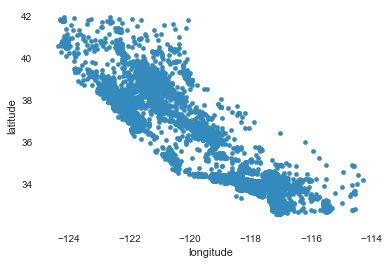

In [62]:
#visualise geographical data
housing.plot(kind ='scatter', x ='longitude', y='latitude')

Text(0.5, 1.0, 'housing data set geographical data visualisation')

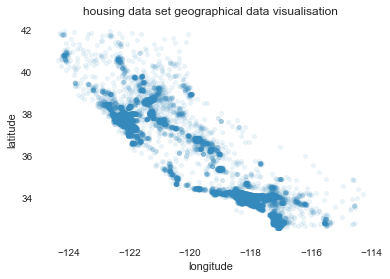

In [63]:
#housing data set geographical data visualisation
housing.plot(kind ='scatter', x ='longitude', y='latitude', alpha = 0.1)
plt.title("housing data set geographical data visualisation")

C:\Users\DELL\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

C:\Users\DELL\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:307: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.

C:\Users\DELL\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

C:\Users\DELL\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:313: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor relea

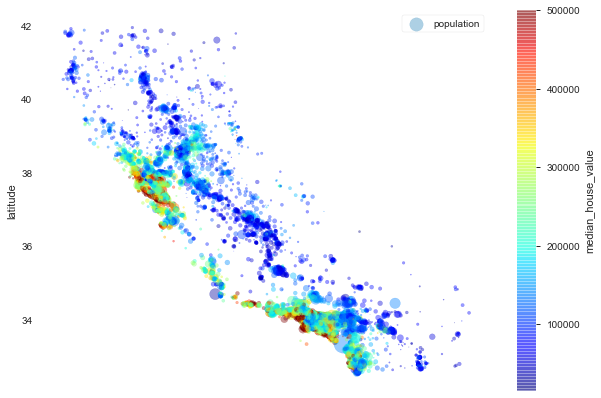

In [64]:
housing.plot(kind ='scatter',x= 'longitude',y= 'latitude', alpha = 0.4,
             s= housing['population']/100, label = 'population', figsize = (10,7), 
             c = 'median_house_value', cmap=plt.get_cmap('jet'), colorbar=True,)
plt.legend()

In [65]:
import matplotlib.image as mpimg

In [66]:
#loading california graph 
california_img=mpimg.imread('F:/semester2/AML/AML2/california.jpg')



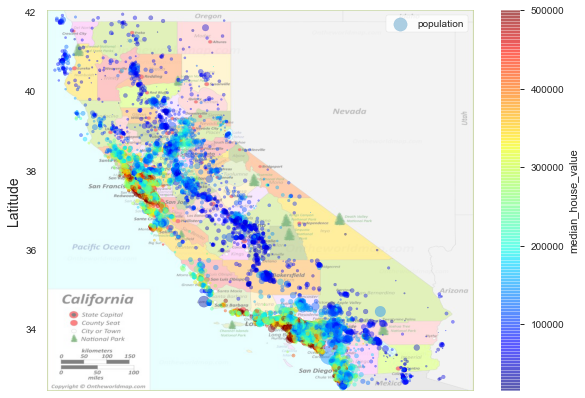

In [67]:
# Map of the location and population of housing districts, along with a heatmap to show where homes are the most expensive.
housing.plot(kind='scatter', x='longitude', y='latitude', alpha=0.4,
				s=housing['population']/100, label='population', figsize=(10,7),
				c='median_house_value', cmap=plt.get_cmap('jet'), colorbar=True)


plt.imshow(california_img, extent=[-124.55, -113.80, 32.45, 42.05], alpha=0.5)
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)
plt.legend() 

In [68]:
# interactive map chart with plotly 
import plotly.graph_objects as go
fig = go.Figure(data=go.Scattergeo(
        lon = housing['longitude'],
        lat = housing['latitude'],
        text =housing['median_house_value'],
        mode = 'markers',
        marker_color = housing['median_house_value'],
        ))

fig.update_layout(
        title = 'Median House Value in California',
        geo_scope='usa')
    
fig.show()

In [69]:
#finding the corellations
corr_matrix = housing.corr()
print(corr_matrix)

                    longitude  latitude  housing_median_age  total_rooms  \
longitude            1.000000 -0.924478           -0.105848     0.048871   
latitude            -0.924478  1.000000            0.005766    -0.039184   
housing_median_age  -0.105848  0.005766            1.000000    -0.364509   
total_rooms          0.048871 -0.039184           -0.364509     1.000000   
total_bedrooms       0.076598 -0.072419           -0.325047     0.929379   
population           0.108030 -0.115222           -0.298710     0.855109   
households           0.063070 -0.077647           -0.306428     0.918392   
median_income       -0.019583 -0.075205           -0.111360     0.200087   
median_house_value  -0.047432 -0.142724            0.114110     0.135097   

                    total_bedrooms  population  households  median_income  \
longitude                 0.076598    0.108030    0.063070      -0.019583   
latitude                 -0.072419   -0.115222   -0.077647      -0.075205   
housing_

Text(0, 0.5, 'Variable')

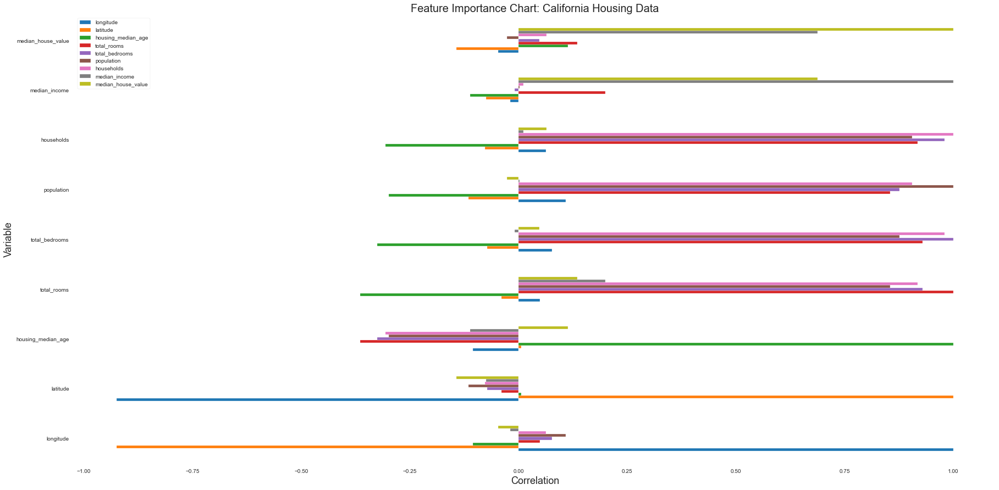

In [70]:
corr_matrix.plot(kind='barh', figsize=(30,15))
plt.title('Feature Importance Chart: California Housing Data', fontsize = 20)
plt.xlabel('Correlation', fontsize=18)
plt.ylabel('Variable', fontsize=18)

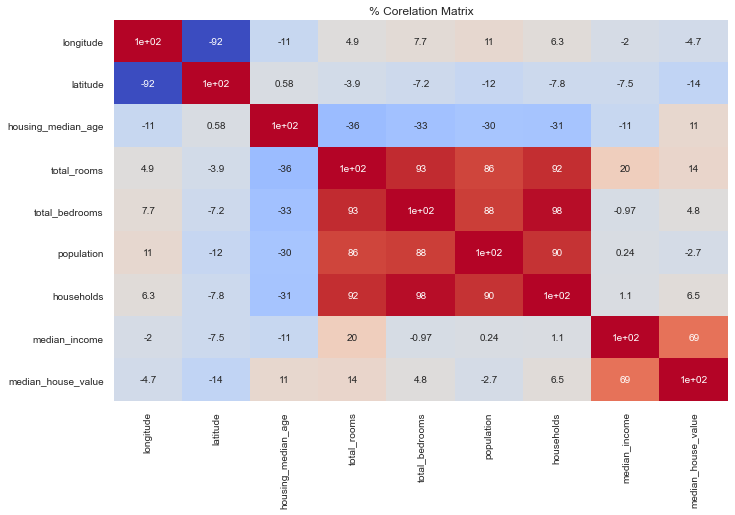

In [71]:
#corelation matrix
plt.figure(figsize=(11,7))
sns.heatmap(cbar=False,annot=True,data=housing.corr()*100,cmap='coolwarm')
plt.title('% Corelation Matrix')
plt.show()

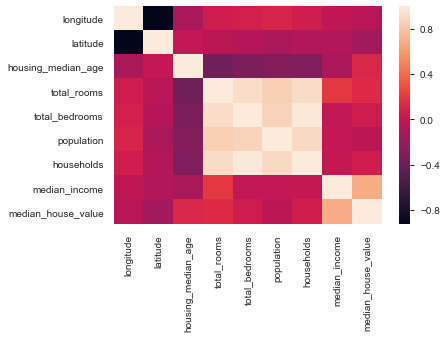

In [72]:
#heatmap for corelation matrix
sns.heatmap(corr_matrix)


In [73]:
# Checking the how much each attribute correlates with the median house value
corr_matrix['median_house_value'].sort_values()

latitude             -0.142724
longitude            -0.047432
population           -0.026920
total_bedrooms        0.047689
households            0.064506
housing_median_age    0.114110
total_rooms           0.135097
median_income         0.687160
median_house_value    1.000000
Name: median_house_value, dtype: float64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000116BDE2C550>,
      dtype=object)

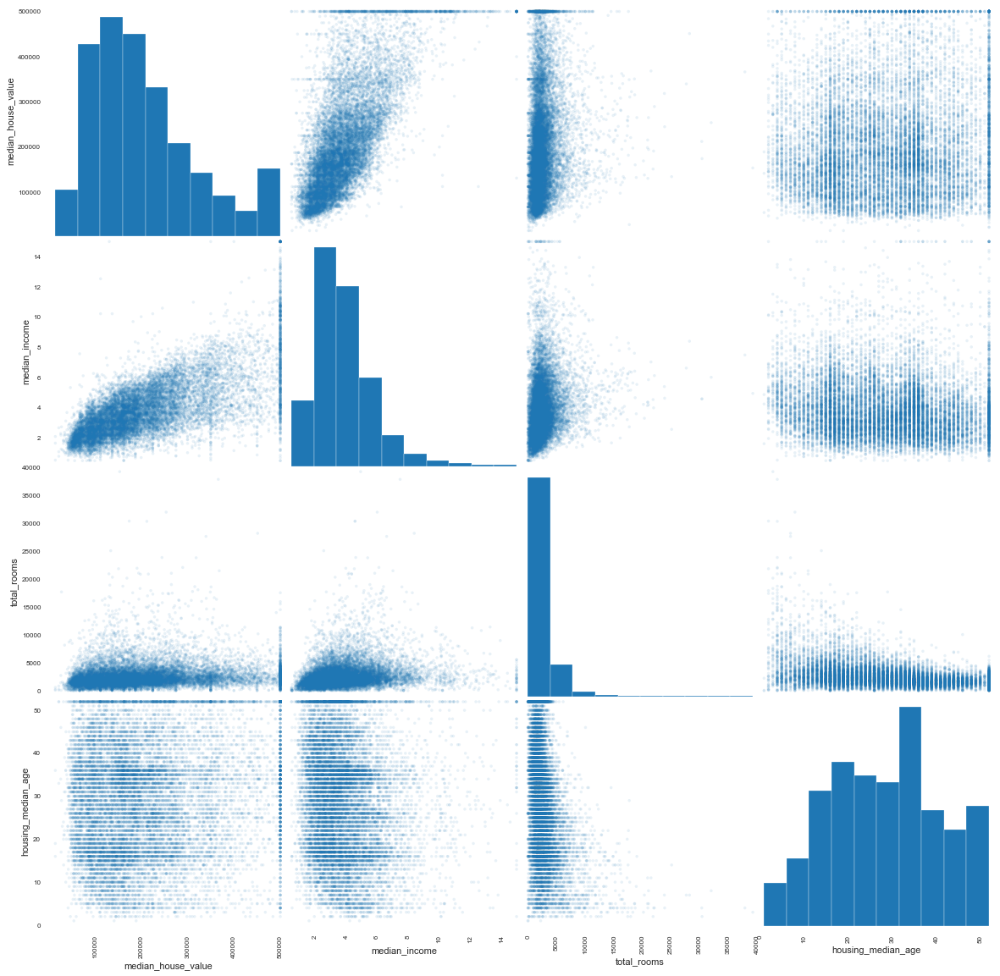

In [74]:
#finding corelations using pandas
from pandas.plotting import scatter_matrix
attributes = ['median_house_value','median_income','total_rooms','housing_median_age']
scatter_matrix(housing[attributes], figsize=(20,20), alpha = 0.1)

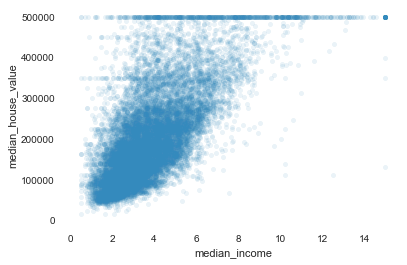

In [75]:
#scatter plot for median_income and median_house_value
housing.plot(kind='scatter', x = 'median_income', y = 'median_house_value', alpha = (0.1))

In [76]:
#feature engineering
# calculated attributes
housing['rooms_per_household'] = housing['total_rooms']/housing['households']
housing['bedrooms_per_room'] = housing['total_bedrooms']/housing['total_rooms']
housing['population_per_household'] = housing['population']/housing['households']

In [77]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,rooms_per_household,bedrooms_per_room,population_per_household
17606,-121.89,37.29,38.0,1568.0,351.0,710.0,339.0,2.7042,286600.0,<1H OCEAN,4.625369,0.223852,2.094395
18632,-121.93,37.05,14.0,679.0,108.0,306.0,113.0,6.4214,340600.0,<1H OCEAN,6.008850,0.159057,2.707965
14650,-117.20,32.77,31.0,1952.0,471.0,936.0,462.0,2.8621,196900.0,NEAR OCEAN,4.225108,0.241291,2.025974
3230,-119.61,36.31,25.0,1847.0,371.0,1460.0,353.0,1.8839,46300.0,INLAND,5.232295,0.200866,4.135977
3555,-118.59,34.23,17.0,6592.0,1525.0,4459.0,1463.0,3.0347,254500.0,<1H OCEAN,4.505810,0.231341,3.047847
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6563,-118.13,34.20,46.0,1271.0,236.0,573.0,210.0,4.9312,240200.0,INLAND,6.052381,0.185681,2.728571
12053,-117.56,33.88,40.0,1196.0,294.0,1052.0,258.0,2.0682,113000.0,INLAND,4.635659,0.245819,4.077519
13908,-116.40,34.09,9.0,4855.0,872.0,2098.0,765.0,3.2723,97800.0,INLAND,6.346405,0.179609,2.742484
11159,-118.01,33.82,31.0,1960.0,380.0,1356.0,356.0,4.0625,225900.0,<1H OCEAN,5.505618,0.193878,3.808989


In [78]:
#correlation matrix
corr_matrix = housing.corr()

In [79]:
corr_matrix

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,bedrooms_per_room,population_per_household
longitude,1.000000,-0.924478,-0.105848,0.048871,0.076598,0.108030,0.063070,-0.019583,-0.047432,-0.028345,0.095603,-0.000410
latitude,-0.924478,1.000000,0.005766,-0.039184,-0.072419,-0.115222,-0.077647,-0.075205,-0.142724,0.107621,-0.116884,0.005420
housing_median_age,-0.105848,0.005766,1.000000,-0.364509,-0.325047,-0.298710,-0.306428,-0.111360,0.114110,-0.147186,0.136788,0.015031
total_rooms,0.048871,-0.039184,-0.364509,1.000000,0.929379,0.855109,0.918392,0.200087,0.135097,0.127519,-0.192606,-0.024810
total_bedrooms,0.076598,-0.072419,-0.325047,0.929379,1.000000,0.876320,0.980170,-0.009740,0.047689,0.000377,0.086960,-0.028370
population,0.108030,-0.115222,-0.298710,0.855109,0.876320,1.000000,0.904637,0.002380,-0.026920,-0.074692,0.037778,0.076225
households,0.063070,-0.077647,-0.306428,0.918392,0.980170,0.904637,1.000000,0.010781,0.064506,-0.083009,0.067162,-0.027416
median_income,-0.019583,-0.075205,-0.111360,0.200087,-0.009740,0.002380,0.010781,1.000000,0.687160,0.311563,-0.624674,0.021822
median_house_value,-0.047432,-0.142724,0.114110,0.135097,0.047689,-0.026920,0.064506,0.687160,1.000000,0.146285,-0.259984,-0.021985
rooms_per_household,-0.028345,0.107621,-0.147186,0.127519,0.000377,-0.074692,-0.083009,0.311563,0.146285,1.000000,-0.398546,-0.005314


In [80]:
# checking the correlations again
corr_matrix['median_house_value'].sort_values()

bedrooms_per_room          -0.259984
latitude                   -0.142724
longitude                  -0.047432
population                 -0.026920
population_per_household   -0.021985
total_bedrooms              0.047689
households                  0.064506
housing_median_age          0.114110
total_rooms                 0.135097
rooms_per_household         0.146285
median_income               0.687160
median_house_value          1.000000
Name: median_house_value, dtype: float64

In [81]:
#IV] PREPARING DATA FOR MACHINE LEARNING ALGORITHMS 
#training data saperation of predictoirs and labels
# drop target labels for training set
housing = strat_train_set.drop("median_house_value",axis = 1)
# this is the target label vector
housing_labels = strat_train_set['median_house_value'].copy()
print(len(housing))
print(len(housing_labels))

16512
16512


In [82]:
#calculating median for each attribue from sklearn
# using Scikit-Learn Imputer
from sklearn.impute import SimpleImputer
imputer =  SimpleImputer(strategy = 'median')
# remove non-numerical attributes for Imputer by making a copy of the dataframe
housing_num = housing.drop('ocean_proximity', axis =1)
 # this computes median for each attributes and store the result in statistics_ variable
imputer.fit(housing_num)

SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              missing_values=nan, strategy='median', verbose=0)

In [83]:
# same result as housing_num.median().values
imputer.statistics_

array([-118.51  ,   34.26  ,   29.    , 2119.5   ,  433.    , 1164.    ,
        408.    ,    3.5409])

In [84]:
#replacing computed median values in the data set
x=imputer.transform(housing_num)# this is a Numpy array

In [85]:
#converting the np array to pandas dataframe
housing_tr = pd.DataFrame(x,columns = housing_num.columns, index = housing_num.index) # change a Numpy array to a DataFrame

In [86]:
housing_tr['total_bedrooms']

17606     351.0
18632     108.0
14650     471.0
3230      371.0
3555     1525.0
          ...  
6563      236.0
12053     294.0
13908     872.0
11159     380.0
15775     682.0
Name: total_bedrooms, Length: 16512, dtype: float64

In [87]:
#handelling categorical attributes
housing_cat = housing[['ocean_proximity']]
housing_cat.head(20)

,ocean_proximity
17606,<1H OCEAN
18632,<1H OCEAN
14650,NEAR OCEAN
3230,INLAND
3555,<1H OCEAN
19480,INLAND
8879,<1H OCEAN
13685,INLAND
4937,<1H OCEAN
4861,<1H OCEAN


In [88]:
#converting category into numerical as ml algos prefer to work with numbers
from sklearn.preprocessing import OrdinalEncoder
ordinal_encoder = OrdinalEncoder()
housing_cat_encoded = ordinal_encoder.fit_transform(housing_cat)
housing_cat_encoded[:10]

array([[0.],
       [0.],
       [4.],
       [1.],
       [0.],
       [1.],
       [0.],
       [1.],
       [0.],
       [0.]])

In [89]:
#getting the list of categories
ordinal_encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

In [90]:
#performing onehot encoding the categorical attribute
from sklearn.preprocessing import OneHotEncoder
cat_encoder = OneHotEncoder()
housing_cat_1hot = cat_encoder.fit_transform(housing_cat)
print(housing_cat_1hot)
print(housing_cat_1hot.toarray())
print(cat_encoder.categories_)

  (0, 0)	1.0
  (1, 0)	1.0
  (2, 4)	1.0
  (3, 1)	1.0
  (4, 0)	1.0
  (5, 1)	1.0
  (6, 0)	1.0
  (7, 1)	1.0
  (8, 0)	1.0
  (9, 0)	1.0
  (10, 1)	1.0
  (11, 1)	1.0
  (12, 0)	1.0
  (13, 1)	1.0
  (14, 1)	1.0
  (15, 0)	1.0
  (16, 3)	1.0
  (17, 1)	1.0
  (18, 1)	1.0
  (19, 1)	1.0
  (20, 0)	1.0
  (21, 0)	1.0
  (22, 0)	1.0
  (23, 1)	1.0
  (24, 1)	1.0
  :	:
  (16487, 1)	1.0
  (16488, 1)	1.0
  (16489, 4)	1.0
  (16490, 3)	1.0
  (16491, 0)	1.0
  (16492, 3)	1.0
  (16493, 1)	1.0
  (16494, 1)	1.0
  (16495, 0)	1.0
  (16496, 1)	1.0
  (16497, 3)	1.0
  (16498, 1)	1.0
  (16499, 0)	1.0
  (16500, 0)	1.0
  (16501, 0)	1.0
  (16502, 4)	1.0
  (16503, 0)	1.0
  (16504, 1)	1.0
  (16505, 1)	1.0
  (16506, 0)	1.0
  (16507, 1)	1.0
  (16508, 1)	1.0
  (16509, 1)	1.0
  (16510, 0)	1.0
  (16511, 3)	1.0
[[1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1.]
 ...
 [0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]]
[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
      dtype=object)]


In [91]:
#custom transformation
from sklearn.base import BaseEstimator, TransformerMixin
# hardcoded just for this dataset
rooms_xi, bedrooms_xi, population_xi, households_xi = 3,4,5,6
class CombinedAttributeAdder(BaseEstimator, TransformerMixin):
    def __init__(self, add_bedrooms_per_room = True):
        self.add_bedrooms_per_room = add_bedrooms_per_room
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        rooms_per_household=X[:, rooms_xi] / X[:,households_xi]
        population_per_household = X[:, population_xi] / X[:,households_xi]
        if self.add_bedrooms_per_room:
            bedrooms_per_room = X[:, bedrooms_xi] / X[:,rooms_xi]
            return np.c_[X, rooms_per_household, population_per_household, bedrooms_per_room]
        else:
            return np.c_[X, rooms_per_household, population_per_household]
attr_adder = CombinedAttributeAdder(add_bedrooms_per_room = False)
housing_extra_attribs = attr_adder.transform(housing.values)

In [92]:
housing_extra_attribs

array([[-121.89, 37.29, 38.0, ..., '<1H OCEAN', 4.625368731563422,
        2.094395280235988],
       [-121.93, 37.05, 14.0, ..., '<1H OCEAN', 6.008849557522124,
        2.7079646017699117],
       [-117.2, 32.77, 31.0, ..., 'NEAR OCEAN', 4.225108225108225,
        2.0259740259740258],
       ...,
       [-116.4, 34.09, 9.0, ..., 'INLAND', 6.34640522875817,
        2.742483660130719],
       [-118.01, 33.82, 31.0, ..., '<1H OCEAN', 5.50561797752809,
        3.808988764044944],
       [-122.45, 37.77, 52.0, ..., 'NEAR BAY', 4.843505477308295,
        1.9859154929577465]], dtype=object)

In [93]:
#V] Transformation pipelines
# name/estimator pairs for pipeline steps
# each estimator except the last one must be transformers with fit_transform() method
# pipeline fit() calls each fit_transform() of each estimator and fit() for the last estimator
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
num_pipeline = Pipeline([('imputer', SimpleImputer(strategy = 'median')),
    ('attribs_adder', CombinedAttributeAdder()),
    ('std_scaler',StandardScaler()),])
housing_num_tr = num_pipeline.fit_transform(housing_num)

In [94]:
#pipelines to transform both numeric and categorical attributes
from sklearn.compose import ColumnTransformer
num_attribs = list(housing_num)
cat_attribs = ['ocean_proximity']
full_pipeline = ColumnTransformer([
    ('num', num_pipeline, num_attribs),
    ('cat', OneHotEncoder(),cat_attribs),
])
housing_prepared = full_pipeline.fit_transform(housing)

In [95]:
housing_prepared

array([[-1.15604281,  0.77194962,  0.74333089, ...,  0.        ,
         0.        ,  0.        ],
       [-1.17602483,  0.6596948 , -1.1653172 , ...,  0.        ,
         0.        ,  0.        ],
       [ 1.18684903, -1.34218285,  0.18664186, ...,  0.        ,
         0.        ,  1.        ],
       ...,
       [ 1.58648943, -0.72478134, -1.56295222, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.78221312, -0.85106801,  0.18664186, ...,  0.        ,
         0.        ,  0.        ],
       [-1.43579109,  0.99645926,  1.85670895, ...,  0.        ,
         1.        ,  0.        ]])

In [96]:
#VI] TRAINING THE ML MODEL 
#training a linear regression model
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(housing_prepared, housing_labels)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [97]:
#trying linear regression on few instances
some_data = housing.head()
some_labels = housing_labels.head()
some_data_prepared  = full_pipeline.transform(some_data)
print("predictions:", lin_reg.predict(some_data_prepared))
print("actual labels:",list(some_labels))

predictions: [210644.60459286 317768.80697211 210956.43331178  59218.98886849
 189747.55849879]
actual labels: [286600.0, 340600.0, 196900.0, 46300.0, 254500.0]


In [98]:
#MEASURING  linear regression model using "root mean squared error (RMSE)" METRICS
from sklearn.metrics import mean_squared_error
housing_predictions = lin_reg.predict(housing_prepared)
lin_mse = mean_squared_error(housing_labels,housing_predictions)
lin_rmse = np.sqrt(lin_mse)
print(lin_mse)
print(lin_rmse)

4709829587.97112
68628.19819848922


In [99]:
#function to print the  residual plot
def evaluate(ypred,ytest,regressor):
    plt.figure(figsize=(15,8))
    plt.xlabel('(ytest) - (ypred)')
    plt.ylabel('frequency')
    plt.title('residual plot')
    plt.hist(ytest-ypred)
    print("root mean squared error for test data   is "+str(np.sqrt(mean_squared_error(ytest,ypred))))
    plt.show()


root mean squared error for test data   is 68628.19819848922


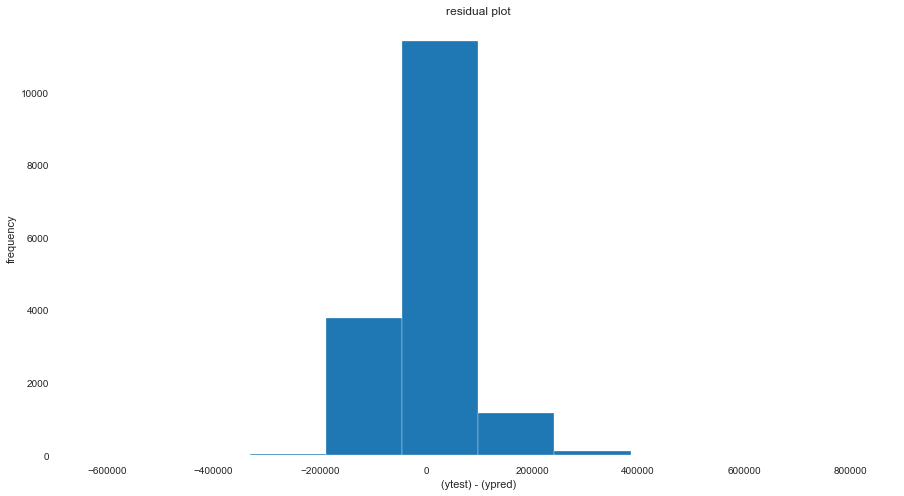

In [100]:
evaluate(housing_predictions, housing_labels,lin_reg)

In [101]:
#AS THERE IS HIGH ERROR,  LETS TRAIN OTHER REGRESSION MODEL FOR OUR DATA AND 
from sklearn.tree import DecisionTreeRegressor
tree_reg = DecisionTreeRegressor()
tree_reg.fit(housing_prepared,housing_labels)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [102]:
housing_predictions = tree_reg.predict(housing_prepared)
tree_mse = mean_squared_error(housing_predictions, housing_labels)
tree_rmse = np.sqrt(tree_mse)
print(tree_mse)
print(tree_rmse)

0.0
0.0


root mean squared error for test data   is 0.0


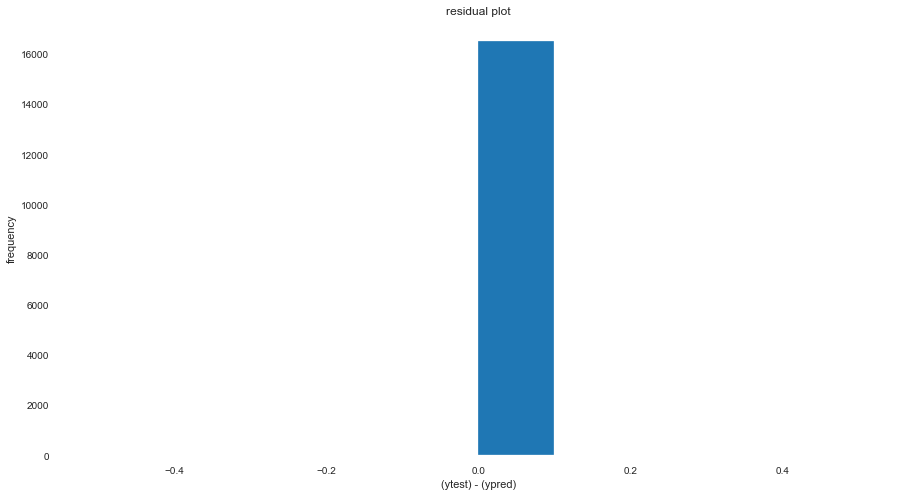

In [103]:
evaluate(housing_predictions, housing_labels,tree_reg)

In [104]:
#performing cross-validation on traiing set using k-folds cross validation from sklearn.model_selectidon
from sklearn.model_selection import cross_val_score
score = cross_val_score(tree_reg, housing_prepared, housing_labels, scoring = 'neg_mean_squared_error', cv = 10)
tree_rmse_scores = np.sqrt(-score)

In [105]:
print(score)
print(tree_rmse_scores)

[-4.72801448e+09 -4.60929827e+09 -5.20215180e+09 -4.91085646e+09
 -5.00636803e+09 -5.64397227e+09 -5.04298026e+09 -4.98177574e+09
 -5.80220675e+09 -5.14816709e+09]
[68760.55905996 67891.81298586 72125.94401907 70077.50325909
 70755.69258197 75126.37534424 71013.9441058  70581.69552703
 76172.21771796 71750.72884515]


In [106]:
def display_scores(score):
    print('scores:', score)
    print('mean:', score.mean())
    print('standard deviation:', score.std())

display_scores(tree_rmse_scores)

scores: [68760.55905996 67891.81298586 72125.94401907 70077.50325909
 70755.69258197 75126.37534424 71013.9441058  70581.69552703
 76172.21771796 71750.72884515]
mean: 71425.64734461326
standard deviation: 2440.4954082569484


In [107]:
#TRAINING RANDOM FOREST REGRESSOR FOR MUCH MORE BETTER MODEL PERFORMANCE
from sklearn.ensemble import RandomForestRegressor
forest_reg = RandomForestRegressor()
forest_reg.fit(housing_prepared, housing_labels)

C:\Users\DELL\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [108]:
#measuring the performance of the model
from sklearn.model_selection import cross_val_score
score = cross_val_score(forest_reg, housing_prepared, housing_labels, scoring = 'neg_mean_squared_error', cv = 10)
forest_rmse_scores = np.sqrt(-score)

In [109]:
display_scores(forest_rmse_scores)

scores: [52565.57493476 50051.53093203 52961.63501435 55441.51981608
 50984.53062633 55369.62976614 52272.09495244 51685.6968362
 54435.6809832  52832.35995105]
mean: 52860.02538125741
standard deviation: 1693.2968017622893


In [110]:
# VII] fine-tuning the model by grid search
from sklearn.model_selection import GridSearchCV
param_grid = [
    {'n_estimators': [3,10,30], 'max_features': [2,4,6,8]},
    {'bootstrap': [False], 'n_estimators': [3,10], 'max_features': [2,3,4]}]
forest_reg = RandomForestRegressor()
grid_search = GridSearchCV(forest_reg, param_grid, cv=5, scoring = 'neg_mean_squared_error', return_train_score = True)
trained_model = grid_search.fit(housing_prepared, housing_labels)

In [111]:
#getting best combinations of parameters
#getting the best estimstors
#getting the evaluation scores
print(grid_search.best_params_)
print(grid_search.best_estimator_)
cvres = grid_search.cv_results_
for mean_score, params in zip(cvres['mean_test_score'], cvres['params']):
    print(np.sqrt(-mean_score), params)

{'max_features': 8, 'n_estimators': 30}
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features=8, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=30,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
64035.42253358676 {'max_features': 2, 'n_estimators': 3}
55727.24101756586 {'max_features': 2, 'n_estimators': 10}
52570.79858173722 {'max_features': 2, 'n_estimators': 30}
60153.82642274462 {'max_features': 4, 'n_estimators': 3}
52942.13958873201 {'max_features': 4, 'n_estimators': 10}
50542.54494241793 {'max_features': 4, 'n_estimators': 30}
59045.315451211 {'max_features': 6, 'n_estimators': 3}
52171.47888701577 {'max_features': 6, 'n_estimators': 10}
50138.08284414933 {'max_features': 6, 'n_es

In [112]:
cvres

{'mean_fit_time': array([0.06337824, 0.20993934, 0.66152921, 0.09893031, 0.34486799,
        1.04600673, 0.14021134, 0.48064942, 1.31976132, 0.1716033 ,
        0.57585344, 1.72908468, 0.09962778, 0.32959442, 0.13105268,
        0.4336503 , 0.15580926, 0.53970613]),
 'std_fit_time': array([0.00431987, 0.00913043, 0.04990847, 0.00626106, 0.02663454,
        0.11984999, 0.00232087, 0.0265902 , 0.05232967, 0.00362155,
        0.01142559, 0.03568784, 0.00381871, 0.0066099 , 0.00427637,
        0.01481938, 0.00376453, 0.01760626]),
 'mean_score_time': array([0.00358639, 0.00898414, 0.03031836, 0.00359721, 0.00977378,
        0.0257308 , 0.00359697, 0.01037989, 0.02579713, 0.0037684 ,
        0.00957499, 0.02778873, 0.00378222, 0.01148291, 0.00379195,
        0.0119556 , 0.00377345, 0.0126071 ]),
 'std_score_time': array([0.00049566, 0.00063091, 0.00760988, 0.00080384, 0.00074739,
        0.00170025, 0.00121007, 0.00148706, 0.00037432, 0.00074417,
        0.00047246, 0.00197071, 0.0004128 , 

In [113]:
#analyzing the best model with their errors
feature_importance = grid_search.best_estimator_.feature_importances_
print(feature_importance)

[7.07928531e-02 6.18399579e-02 4.14374808e-02 1.46387857e-02
 1.52662150e-02 1.42225247e-02 1.43988080e-02 3.72655211e-01
 4.76537078e-02 1.10713356e-01 7.26365932e-02 9.22935890e-03
 1.49378296e-01 9.95178243e-05 2.05178427e-03 2.98554953e-03]


In [114]:
#displaying importance in ascending  order along with the attribute names
extra_attribs = ['rooms_per_hhold', 'pop_per_hhold', 'bedrooms_per_room']
cat_encoder = full_pipeline.named_transformers_['cat']
cat_one_hot_attribs = list(cat_encoder.categories_[0])
attributes = num_attribs + cat_one_hot_attribs + extra_attribs
sorted(zip(feature_importance, attributes), reverse =True)

[(0.3726552111786685, 'median_income'),
 (0.14937829587782167, 'NEAR OCEAN'),
 (0.11071335612097083, 'INLAND'),
 (0.07263659318974898, 'ISLAND'),
 (0.07079285314462225, 'longitude'),
 (0.0618399578618849, 'latitude'),
 (0.047653707832130916, '<1H OCEAN'),
 (0.041437480842482936, 'housing_median_age'),
 (0.015266214971013199, 'total_bedrooms'),
 (0.01463878573569169, 'total_rooms'),
 (0.01439880796550146, 'households'),
 (0.0142225247454981, 'population'),
 (0.00922935890194051, 'NEAR BAY'),
 (0.00298554953406306, 'bedrooms_per_room'),
 (0.0020517842736604403, 'pop_per_hhold'),
 (9.951782430053502e-05, 'rooms_per_hhold')]

In [115]:
#VIII] Evaluating model on the test set and measuaring its performance
final_model = grid_search.best_estimator_
x_test = strat_test_set.drop('median_house_value', axis = 1)
y_test = strat_test_set['median_house_value'].copy()
x_test_prepared = full_pipeline.transform(x_test)
final_predictions = final_model.predict(x_test_prepared)
final_mse = mean_squared_error(y_test, final_predictions)
final_rmse = np.sqrt(final_mse)
print(final_rmse)


48241.45290504171


root mean squared error for test data   is 48241.45290504171


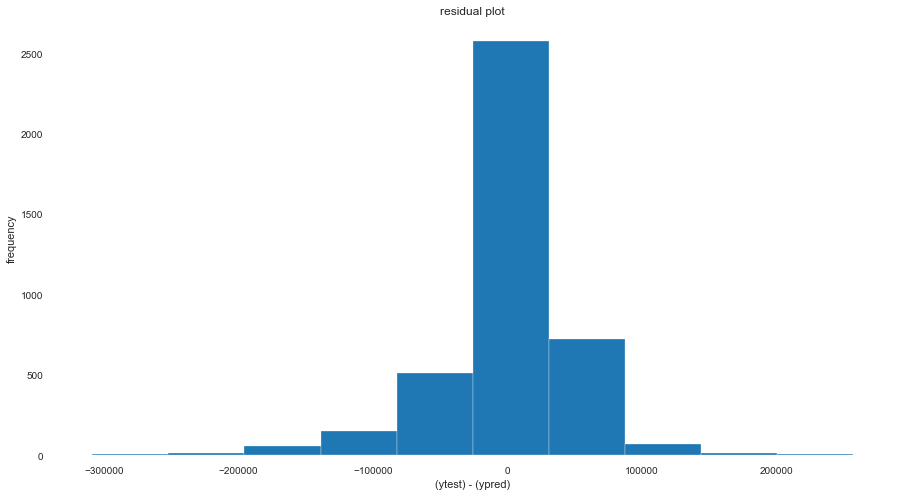

In [116]:
evaluate(y_test, final_predictions,x_test_prepared)

In [117]:
#COMPUTING 95% CONFIDANCE INTERVAL FOR THIS GENERALISATION ERROR
from scipy import stats
confidance = 0.95
squared_errors = (final_predictions - y_test) ** 2
squared_errors

5241     5.091175e+08
10970    9.030025e+08
20351    2.342560e+07
6568     1.463318e+09
13285    2.346003e+08
             ...     
20519    1.709120e+08
17430    4.214809e+08
4019     7.932930e+07
12107    8.747792e+08
2398     2.426219e+09
Name: median_house_value, Length: 4128, dtype: float64

In [118]:
np.sqrt(stats.t.interval(confidance, len(squared_errors)-1, loc = squared_errors.mean(), scale = stats.sem(squared_errors)))

array([46202.54483289, 50197.61356622])